## Import potrzebnych bibliotek

In [314]:
import numpy as np 
import pandas as pd 
from datetime import datetime
import calendar
import matplotlib.pyplot as plt
import plotly.express as px

import seaborn as sns

### Wczytanie bazy danych

In [315]:
df=pd.read_csv('Car_sale_ads.csv')
df

### Przekształcenia zbioru danych

In [317]:
df.isnull().sum()

Index                           0
Price                           0
Currency                        0
Condition                       0
Vehicle_brand                   0
Vehicle_model                   0
Vehicle_version             70222
Vehicle_generation          60444
Production_year                 0
Mileage_km                    983
Power_HP                      643
Displacement_cm3             1966
Fuel_type                       0
CO2_emissions              114257
Drive                       15076
Transmission                  479
Type                            0
Doors_number                 1487
Colour                          0
Origin_country              89992
First_owner                143210
First_registration_date    121859
Offer_publication_date          0
Offer_location                  0
Features                        0
dtype: int64

In [318]:
df.drop(columns=['Vehicle_version', 'Vehicle_generation', 'CO2_emissions', 'Origin_country', 'First_owner', 'First_registration_date'], inplace =True)

In [319]:
df['Mileage_km'] = df['Mileage_km'].fillna(df['Mileage_km'].mean())
df['Power_HP']=df['Power_HP'].fillna(df['Power_HP'].mean())
df['Displacement_cm3']=df['Displacement_cm3'].fillna(df['Displacement_cm3'].mean())

In [320]:
df['Doors_number'].value_counts()

5.0     158814
4.0      27875
3.0      12845
2.0       7215
6.0         51
7.0          8
1.0          4
55.0         2
9.0          2
10.0         1
Name: Doors_number, dtype: int64

In [321]:
df['Doors_number'] = df['Doors_number'].fillna('5')

In [322]:
df['Doors_number'].value_counts()

5.0     158814
4.0      27875
3.0      12845
2.0       7215
5         1487
6.0         51
7.0          8
1.0          4
55.0         2
9.0          2
10.0         1
Name: Doors_number, dtype: int64

In [323]:
df.isnull().sum()

Index                         0
Price                         0
Currency                      0
Condition                     0
Vehicle_brand                 0
Vehicle_model                 0
Production_year               0
Mileage_km                    0
Power_HP                      0
Displacement_cm3              0
Fuel_type                     0
Drive                     15076
Transmission                479
Type                          0
Doors_number                  0
Colour                        0
Offer_publication_date        0
Offer_location                0
Features                      0
dtype: int64

In [324]:
df = df.fillna('no info')

In [325]:
df.dtypes

Index                       int64
Price                       int64
Currency                   object
Condition                  object
Vehicle_brand              object
Vehicle_model              object
Production_year             int64
Mileage_km                float64
Power_HP                  float64
Displacement_cm3          float64
Fuel_type                  object
Drive                      object
Transmission               object
Type                       object
Doors_number               object
Colour                     object
Offer_publication_date     object
Offer_location             object
Features                   object
dtype: object

In [326]:
df['Offer_publication_date'] = [datetime.strptime(x,"%d/%m/%Y") for x in df['Offer_publication_date']]

In [327]:
df.dtypes

Index                              int64
Price                              int64
Currency                          object
Condition                         object
Vehicle_brand                     object
Vehicle_model                     object
Production_year                    int64
Mileage_km                       float64
Power_HP                         float64
Displacement_cm3                 float64
Fuel_type                         object
Drive                             object
Transmission                      object
Type                              object
Doors_number                      object
Colour                            object
Offer_publication_date    datetime64[ns]
Offer_location                    object
Features                          object
dtype: object

In [328]:
df.nunique()

Index                     208304
Price                      14142
Currency                       2
Condition                      2
Vehicle_brand                108
Vehicle_model               1203
Production_year               92
Mileage_km                 52008
Power_HP                     574
Displacement_cm3            1182
Fuel_type                      8
Drive                          6
Transmission                   3
Type                           9
Doors_number                  11
Colour                        14
Offer_publication_date        41
Offer_location             13635
Features                  177211
dtype: int64

In [329]:
df['Currency'].unique()

array(['PLN', 'EUR'], dtype=object)

In [330]:
kurs_EUR=4.76

In [331]:
df_EUR = df[df['Currency'] == 'EUR']
df_EUR

In [333]:
df = df.drop(df[df.Currency == 'EUR'].index)

In [334]:
df_EUR['Price'] = df_EUR['Price'].apply(lambda x: x*kurs_EUR).round()
df_EUR['Currency'] = df_EUR['Currency'] = 'PLN'
df_EUR.head()

In [336]:
df = pd.concat([df, df_EUR], join='inner', copy=False)
df

In [338]:
df["Offer_publication_month"] = df.Offer_publication_date.apply(lambda x: calendar.month_name[x.month])
df.head()

,Index,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Displacement_cm3,Fuel_type,Drive,Transmission,Type,Doors_number,Colour,Offer_publication_date,Offer_location,Features,Offer_publication_month
0,0,86200.0,PLN,New,Abarth,595,2021,1.0,145.0,1400.0,Gasoline,Front wheels,Manual,small_cars,3,gray,2021-05-04,"ul. Jubilerska 6 - 04-190 Warszawa, Mazowiecki...",[],May
1,1,43500.0,PLN,Used,Abarth,Other,1974,59000.0,75.0,1100.0,Gasoline,Front wheels,Manual,coupe,2,silver,2021-05-03,"kanonierska12 - 04-425 Warszawa, Rembertów (Po...",[],May
2,2,44900.0,PLN,Used,Abarth,500,2018,52000.0,180.0,1368.0,Gasoline,no info,Automatic,small_cars,3,silver,2021-05-03,"Warszawa, Mazowieckie, Białołęka","['ABS', 'Electric front windows', 'Drivers air...",May
3,3,39900.0,PLN,Used,Abarth,500,2012,29000.0,160.0,1368.0,Gasoline,Front wheels,Manual,small_cars,3,gray,2021-04-30,"Jaworzno, Śląskie","['ABS', 'Electric front windows', 'Drivers air...",April
4,4,97900.0,PLN,New,Abarth,595,2021,600.0,165.0,1368.0,Gasoline,no info,Manual,small_cars,3,blue,2021-04-30,"ul. Gorzysława 9 - 61-057 Poznań, Nowe Miasto ...","['ABS', 'Electrically adjustable mirrors', 'Pa...",April


### Wizualizacja danych

In [433]:
sns.set_theme(rc = {'figure.figsize' : (10, 8)}, font_scale=1.4)

Text(0.5, 1.0, 'Liczba ofert wystawionych w poszczególnych miesiącach')

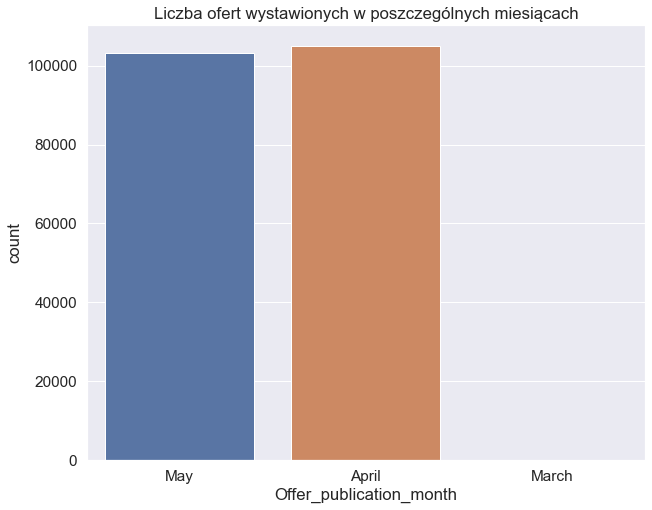

In [434]:
sns.countplot(x='Offer_publication_month', data=df).set_title('Liczba ofert wystawionych w poszczególnych miesiącach')

Text(0.5, 1.0, 'Udział aut nowych i używanych w omawianych ogłoszeniach')

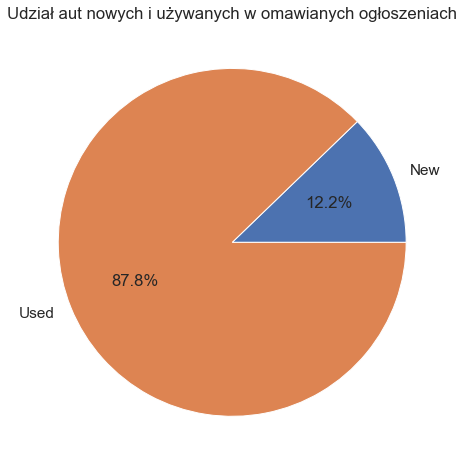

In [490]:
plt.pie(df.groupby('Condition').size().values, autopct="%1.1f%%", labels = df.Condition.unique())
plt.title('Udział aut nowych i używanych w omawianych ogłoszeniach')

Text(0.5, 1.0, 'Podział ilości ogłoszeń ze względu na rodzaj zasilania silnika')

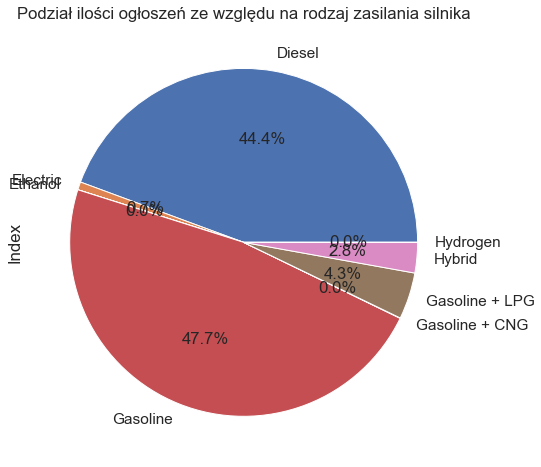

In [450]:
df.groupby('Fuel_type')['Index'].count().plot.pie(autopct="%1.1f%%")
plt.title('Podział ilości ogłoszeń ze względu na rodzaj zasilania silnika')

Text(0.5, 1.0, 'Udział rodzajów aut w omawianych ogłoszeniach')

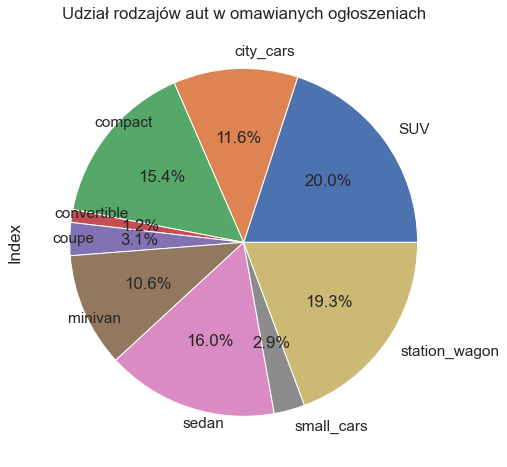

In [468]:
df.groupby('Type')['Index'].count().plot.pie(autopct="%1.1f%%", center=(1.5, 0))
plt.title('Udział rodzajów aut w omawianych ogłoszeniach')

C:\Users\Lukasz\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Rozkład mocy oferowanych samochodów')

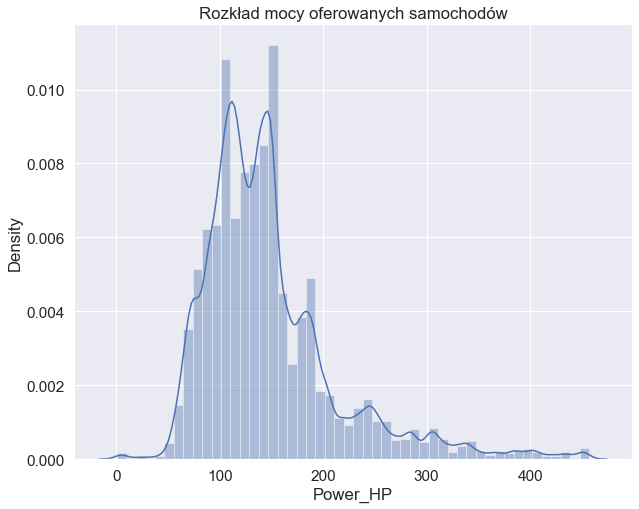

In [469]:
q = df['Power_HP'].quantile(0.99)
df_Power = df[df['Power_HP'] < q]
sns.distplot(df_Power['Power_HP']).set_title('Rozkład mocy oferowanych samochodów')

C:\Users\Lukasz\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Rozkład pojemności silnika oferowanych samochodów')

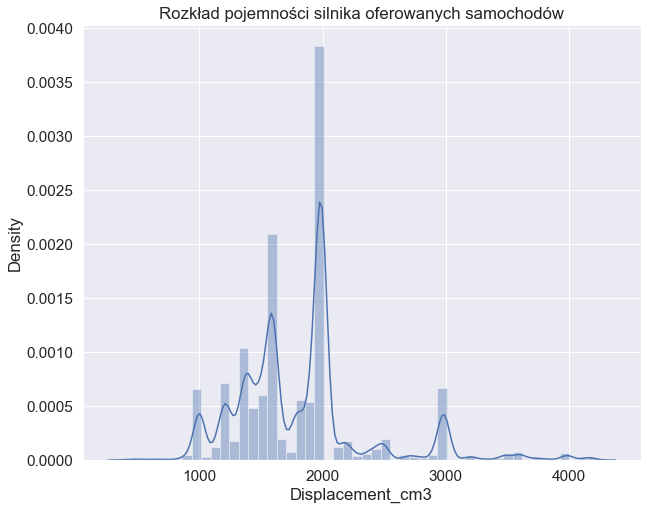

In [470]:
q = df['Displacement_cm3'].quantile(0.98)
df_Power = df[df['Displacement_cm3'] < q]
sns.distplot(df_Power['Displacement_cm3']).set_title('Rozkład pojemności silnika oferowanych samochodów')

In [472]:
z = df['Vehicle_brand'].value_counts().head(30)
fig = px.bar(z, x=z.index, y=z.values, color=z.index, text=z.values, height=700, 
             labels={'index':'Vehicle brand', 'y':'count', 'text':'count'}, template='seaborn', 
             title='Marki samochodów o największej liczbie ogłoszeń')
fig.show()

In [ ]:
px.funnel(df['Vehicle_model'].value_counts()[:40], height = 1000, title='Modele samochodów o największej liczbie ogłoszeń')

In [ ]:
df.groupby('Production_year')['Index'].count().tail(30).plot.bar(figsize=(15,10))
plt.title('Rok produkcji aut')

In [477]:
df_Price = df_Prod_Price[df_Prod_Price['Price'] < 220000]
px.histogram(df_Price, x='Price', title='Rozkład wartości samochodów')

In [401]:
df_Prod_Price = df[df['Production_year'] > 1995] 
df_Prod_Price = df_Prod_Price[df_Prod_Price['Price'] < 300000]

px.density_heatmap(df_Prod_Price, x='Production_year', y='Price', color_continuous_scale="Viridis", 
                   title='Zależność pomiędzy ceną samochodu a rokiem jego produkcji')

In [480]:
df_Dis_Mil = df[df['Mileage_km'] < 400000] 
df_Dis_Mil = df_Dis_Mil[df_Dis_Mil['Displacement_cm3'] <= 3000]

px.density_heatmap(df_Dis_Mil, x='Displacement_cm3', y='Mileage_km', color_continuous_scale="Viridis", 
                   title='Zależność pomiędzy pojemnością silnika a przebiegiem auta')

Text(0.5, 1.0, 'Średnia cena auta według poszczególnych typów')

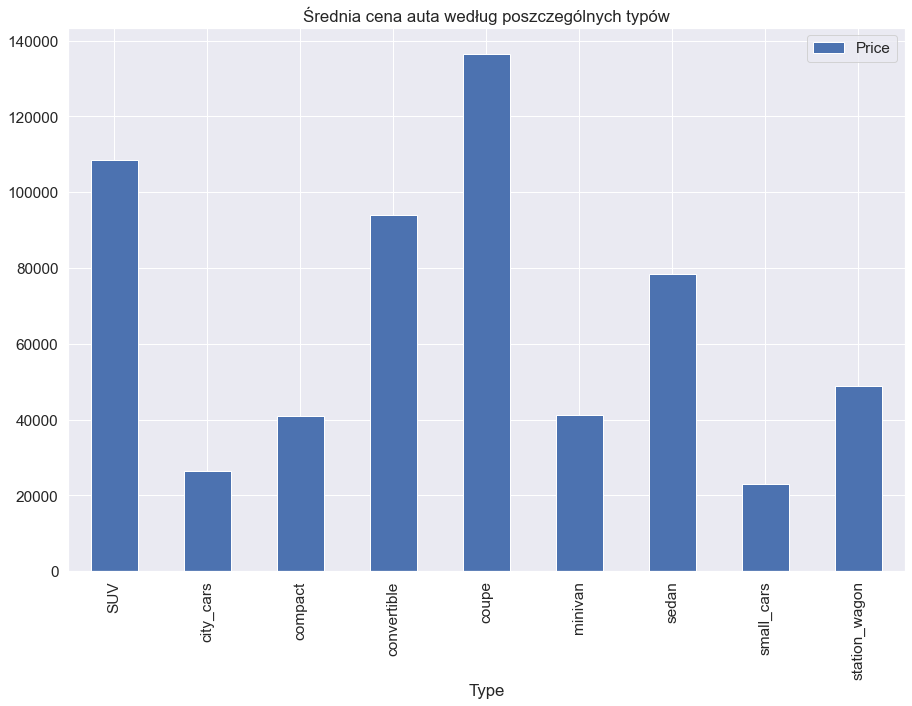

In [482]:
df.groupby(['Type']).agg({'Price':'mean'}).plot.bar(figsize=(15,10))
plt.title('Średnia cena auta według poszczególnych typów')

Text(0.5, 1.0, 'Najdroższe modele samochodów')

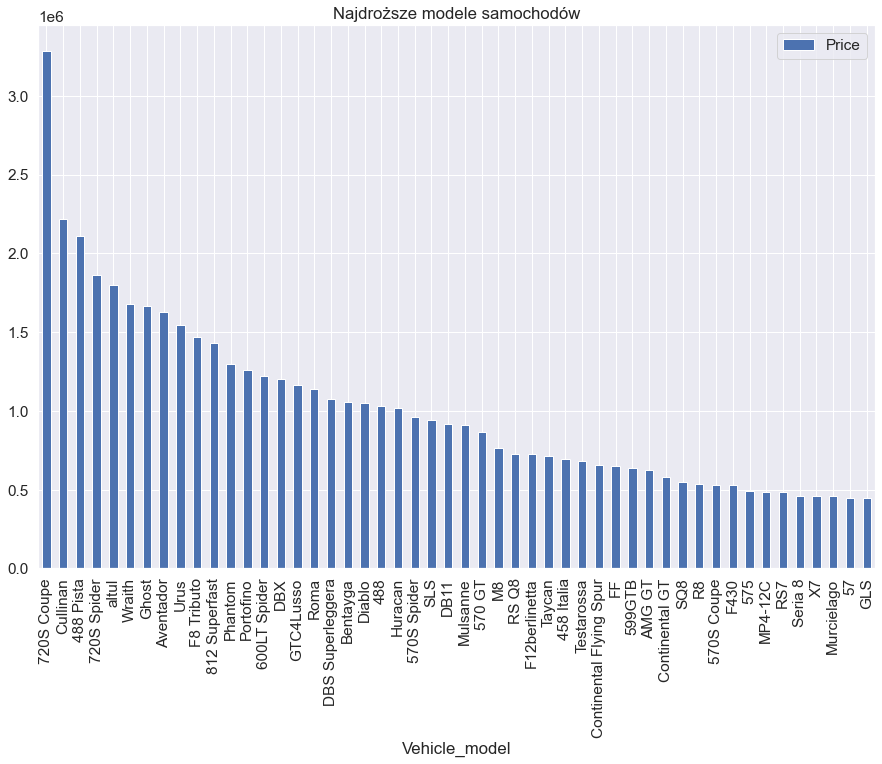

In [483]:
df.groupby(['Vehicle_model']).agg({'Price':'mean'}).sort_values(by='Price', ascending=False)[:50].plot.bar(figsize=(15,10))
plt.title('Najdroższe modele samochodów')

Text(0.5, 1.0, 'Najdroższe marki samochodów')

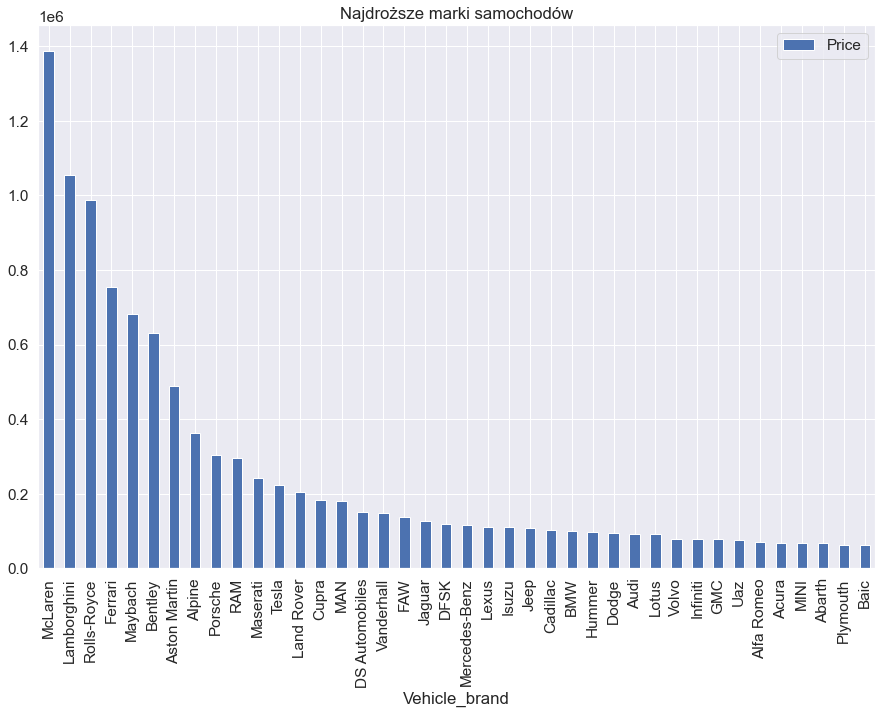

In [484]:
df.groupby(['Vehicle_brand']).agg({'Price':'mean'}).sort_values(by='Price', ascending=False)[:40].plot.bar(figsize=(15,10))
plt.title('Najdroższe marki samochodów')

Text(0.5, 1.0, 'Średni przebieg auta według typów')

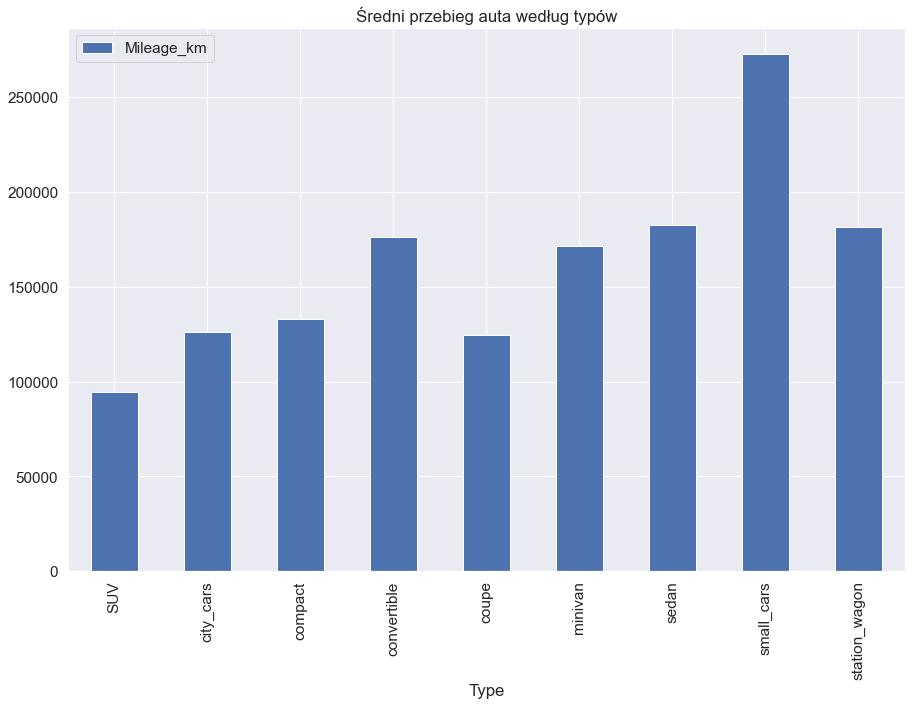

In [485]:
df.groupby(['Type']).agg({'Mileage_km':'mean'}).plot.bar(figsize=(15,10))
plt.title('Średni przebieg auta według typów')

In [489]:
px.treemap(df, path=[px.Constant('Car'), 'Vehicle_brand', 'Vehicle_model'], width = 1000, height=1000, 
           title='Pokazanie udziału rónych marek oraz modeli samochodów w ilości ogłoszeń')

Text(0.5, 1.0, 'Korelacja zmiennych w zbiorze')

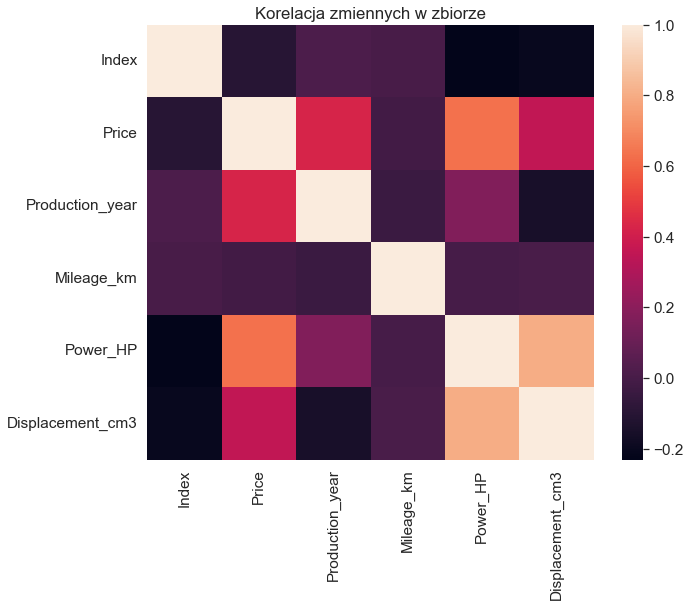

In [486]:
corr = df.corr()
sns.heatmap(corr).set_title('Korelacja zmiennych w zbiorze')

In [293]:
df.columns

Index(['Index', 'Price', 'Currency', 'Condition', 'Vehicle_brand',
       'Vehicle_model', 'Production_year', 'Mileage_km', 'Power_HP',
       'Displacement_cm3', 'Fuel_type', 'Drive', 'Transmission', 'Type',
       'Doors_number', 'Colour', 'Offer_publication_date', 'Offer_location',
       'Features', 'Offer_publication_month'],
      dtype='object')

#### Zmiana indeksu danych

In [294]:
df.set_index('Index')

,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Displacement_cm3,Fuel_type,Drive,Transmission,Type,Doors_number,Colour,Offer_publication_date,Offer_location,Features,Offer_publication_month
Index,,,,,,,,,,,,,,,,,,,
0,86200.0,PLN,New,Abarth,595,2021,1.0,145.0,1400.0,Gasoline,Front wheels,Manual,small_cars,3,gray,2021-05-04,"ul. Jubilerska 6 - 04-190 Warszawa, Mazowiecki...",[],May
1,43500.0,PLN,Used,Abarth,Other,1974,59000.0,75.0,1100.0,Gasoline,Front wheels,Manual,coupe,2,silver,2021-05-03,"kanonierska12 - 04-425 Warszawa, Rembertów (Po...",[],May
2,44900.0,PLN,Used,Abarth,500,2018,52000.0,180.0,1368.0,Gasoline,no info,Automatic,small_cars,3,silver,2021-05-03,"Warszawa, Mazowieckie, Białołęka","['ABS', 'Electric front windows', 'Drivers air...",May
3,39900.0,PLN,Used,Abarth,500,2012,29000.0,160.0,1368.0,Gasoline,Front wheels,Manual,small_cars,3,gray,2021-04-30,"Jaworzno, Śląskie","['ABS', 'Electric front windows', 'Drivers air...",April
4,97900.0,PLN,New,Abarth,595,2021,600.0,165.0,1368.0,Gasoline,no info,Manual,small_cars,3,blue,2021-04-30,"ul. Gorzysława 9 - 61-057 Poznań, Nowe Miasto ...","['ABS', 'Electrically adjustable mirrors', 'Pa...",April
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203703,135660.0,PLN,Used,Volvo,S60,2017,18000.0,367.0,1969.0,Gasoline,no info,Automatic,sedan,4,blue,2021-05-03,"Radom, Mazowieckie","['ABS', 'Electric front windows', 'Drivers air...",May
208176,89964.0,PLN,Used,Volvo,XC 90,2015,115000.0,235.0,2000.0,Diesel,4x4 (permanent),Automatic,SUV,5,other,2021-04-26,"katowicka 68 - 43-100 Tychy, Śląskie (Polska)","['ABS', 'Electric front windows', 'Drivers air...",April
208205,34272.0,PLN,Used,Volvo,V40,2017,54000.0,120.0,2000.0,Diesel,Front wheels,Manual,compact,5,other,2021-04-26,"katowicka 68 - 43-100 Tychy, Śląskie (Polska)","['ABS', 'Electric front windows', 'Drivers air...",April


### Przygotowanie danych na potrzeby algorytmów machine learning

In [295]:
df = df.drop(['Currency','Offer_publication_date', 'Offer_location', 'Features'], axis=1)

In [296]:
cat_features = ['Condition', 'Vehicle_brand', 'Vehicle_model', 'Fuel_type', 'Drive', 
                'Transmission', 'Type', 'Colour', 'Offer_publication_month']
num_features = ['Production_year', 'Mieage_km', 'Power_HP', 'Displacement_cm3', 'Doors_number']
target = 'Price'

In [297]:
from sklearn import preprocessing

df_l = df.copy()

mapy = {}
for feature in cat_features:

    le = preprocessing.LabelEncoder()
    df_l[feature] = le.fit_transform(df[feature])
    mapy[feature] = le

In [298]:
df_l

,Index,Price,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Displacement_cm3,Fuel_type,Drive,Transmission,Type,Doors_number,Colour,Offer_publication_month
0,0,86200.0,0,0,124,2021,1.0,145.0,1400.0,3,3,1,7,3,6,2
1,1,43500.0,1,0,771,1974,59000.0,75.0,1100.0,3,3,1,4,2,10,2
2,2,44900.0,1,0,114,2018,52000.0,180.0,1368.0,3,5,0,7,3,10,2
3,3,39900.0,1,0,114,2012,29000.0,160.0,1368.0,3,3,1,7,3,6,0
4,4,97900.0,0,0,124,2021,600.0,165.0,1368.0,3,5,1,7,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203703,203703,135660.0,1,100,905,2017,18000.0,367.0,1969.0,3,5,0,6,4,2,2
208176,208176,89964.0,1,100,1149,2015,115000.0,235.0,2000.0,0,2,0,0,5,8,0
208205,208205,34272.0,1,100,1093,2017,54000.0,120.0,2000.0,0,3,1,2,5,8,0
208232,208232,42364.0,1,100,1147,2016,79000.0,163.0,2000.0,0,3,0,0,5,8,0


In [299]:
features = df_l.columns.tolist()
features.remove(target)
print(features)

['Index', 'Condition', 'Vehicle_brand', 'Vehicle_model', 'Production_year', 'Mileage_km', 'Power_HP', 'Displacement_cm3', 'Fuel_type', 'Drive', 'Transmission', 'Type', 'Doors_number', 'Colour', 'Offer_publication_month']


Text(0.5, 1.0, 'Korelacja zmiennych po przekształceniu zmiennych')

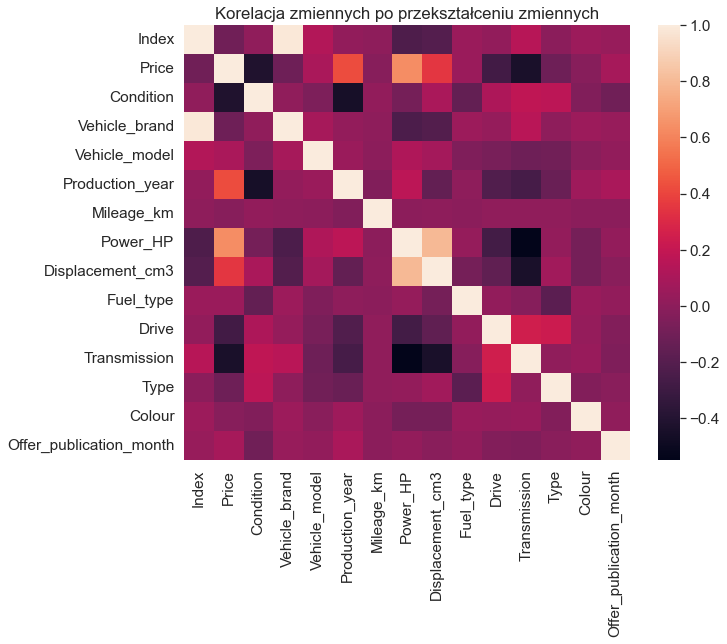

In [488]:
sns.heatmap(df_l.corr()).set_title('Korelacja zmiennych po przekształceniu zmiennych')

In [301]:
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.linear_model import LinearRegression
from sklearn import neighbors

In [302]:
X = df_l.drop('Price', axis=1)
y = df_l['Price']

In [303]:
df_l

,Index,Price,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Displacement_cm3,Fuel_type,Drive,Transmission,Type,Doors_number,Colour,Offer_publication_month
0,0,86200.0,0,0,124,2021,1.0,145.0,1400.0,3,3,1,7,3,6,2
1,1,43500.0,1,0,771,1974,59000.0,75.0,1100.0,3,3,1,4,2,10,2
2,2,44900.0,1,0,114,2018,52000.0,180.0,1368.0,3,5,0,7,3,10,2
3,3,39900.0,1,0,114,2012,29000.0,160.0,1368.0,3,3,1,7,3,6,0
4,4,97900.0,0,0,124,2021,600.0,165.0,1368.0,3,5,1,7,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203703,203703,135660.0,1,100,905,2017,18000.0,367.0,1969.0,3,5,0,6,4,2,2
208176,208176,89964.0,1,100,1149,2015,115000.0,235.0,2000.0,0,2,0,0,5,8,0
208205,208205,34272.0,1,100,1093,2017,54000.0,120.0,2000.0,0,3,1,2,5,8,0
208232,208232,42364.0,1,100,1147,2016,79000.0,163.0,2000.0,0,3,0,0,5,8,0


In [304]:
x_train, x_test, y_train, y_test =train_test_split(X, y, train_size=0.8)

In [522]:
model = LinearRegression()
model.fit(x_train, y_train)
model.score(x_test, y_test)

0.6200853232551229

In [523]:
preds = model.predict(x_test)

In [524]:
print("R^2: %.2f" % metrics.r2_score(y_test, preds))
print("Mean squared error: %.2f" % metrics.mean_squared_error(y_test, preds))
print("Root mean squared error: %.2f" % np.sqrt(metrics.mean_squared_error(y_test, preds)))
print("Mean absolute error: %.2f" % metrics.mean_absolute_error(y_test, preds))

R^2: 0.62
Mean squared error: 2876879599.14
Root mean squared error: 53636.55
Mean absolute error: 28696.23


In [502]:
from sklearn.ensemble import RandomForestRegressor()

model = RandomForestRegressor()
model.fit(x_train, y_train)
model.score(x_test, y_test)

0.9135528969901663

In [520]:
preds = model.predict(x_test)

In [521]:
print("R^2: %.2f" % metrics.r2_score(y_test, preds))
print("Mean squared error: %.2f" % metrics.mean_squared_error(y_test, preds))
print("Root mean squared error: %.2f" % np.sqrt(metrics.mean_squared_error(y_test, preds)))
print("Mean absolute error: %.2f" % metrics.mean_absolute_error(y_test, preds))

R^2: 0.91
Mean squared error: 654615160.39
Root mean squared error: 25585.45
Mean absolute error: 8565.16
